In [1]:
import numpy as np
import pandas as pd
import mne
import os
import matplotlib.pyplot as plt
from scipy.signal import find_peaks, resample, savgol_filter
import plotly.graph_objects as go
from source.data_loader import load_eeg_data, open_json_file, select_recording, read_time_domain_data, compute_eeg_power

from source.sync_peaks_finder import find_eeg_peak, find_dbs_peak

In [2]:
sub_ids = [ 'P4-2001', 'P4-2002', 'P4-2003', 'P4-2004', 'P4-2005', 'P4-2007', 'P4-2008', 'P4-2009']

# sub_ids = ['P4-2008']

block = 'baseline'

dataDir_server = r"/Volumes/03_Neurofeedback/project_only/02_Data/Patient_NFB"


# EEG extraction + Peak Detection

Old Function: peak detection

---
Processing subject P4-2001 for block baseline...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1.2e+02 - 1.3e+02 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 120.00
- Lower transition bandwidth: 30.00 Hz (-6 dB cutoff frequency: 105.00 Hz)
- Upper passband edge: 130.00 Hz
- Upper transition bandwidth: 32.50 Hz (-6 dB cutoff frequency: 146.25 Hz)
- Filter length: 221 samples (0.111 s)

NOTE: tfr_multitaper() is a legacy function. New code should use .compute_tfr(method="multitaper").
inst is Evoked, setting `average=False`
---
Peak time logged in sync_log.txt
---
Please close the plot to continue.
---


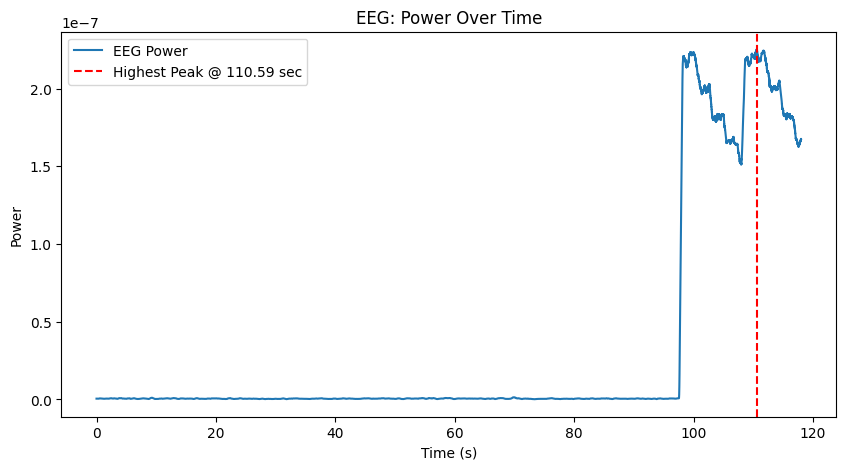

---
Processing subject P4-2002 for block baseline...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1.2e+02 - 1.3e+02 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 120.00
- Lower transition bandwidth: 30.00 Hz (-6 dB cutoff frequency: 105.00 Hz)
- Upper passband edge: 130.00 Hz
- Upper transition bandwidth: 32.50 Hz (-6 dB cutoff frequency: 146.25 Hz)
- Filter length: 221 samples (0.111 s)

NOTE: tfr_multitaper() is a legacy function. New code should use .compute_tfr(method="multitaper").
inst is Evoked, setting `average=False`
---
Peak time logged in sync_log.txt
---
Please close the plot to continue.
---


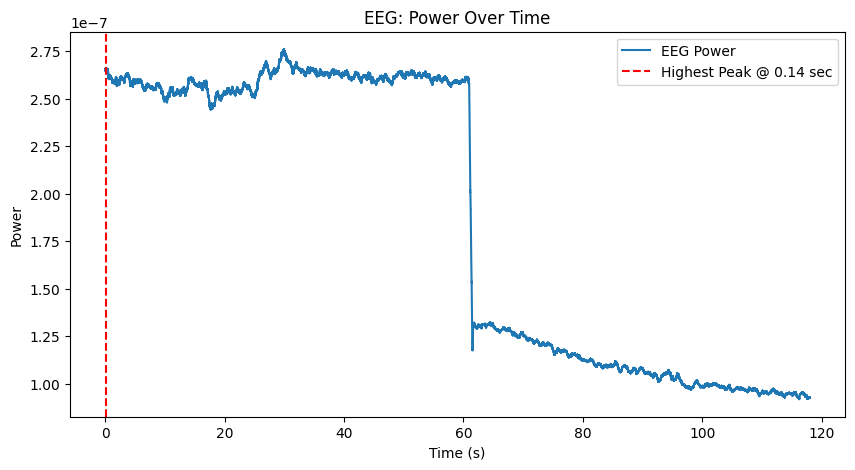

---
Processing subject P4-2003 for block baseline...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1.2e+02 - 1.3e+02 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 120.00
- Lower transition bandwidth: 30.00 Hz (-6 dB cutoff frequency: 105.00 Hz)
- Upper passband edge: 130.00 Hz
- Upper transition bandwidth: 32.50 Hz (-6 dB cutoff frequency: 146.25 Hz)
- Filter length: 221 samples (0.111 s)

NOTE: tfr_multitaper() is a legacy function. New code should use .compute_tfr(method="multitaper").
inst is Evoked, setting `average=False`
---
Peak time logged in sync_log.txt
---
Please close the plot to continue.
---


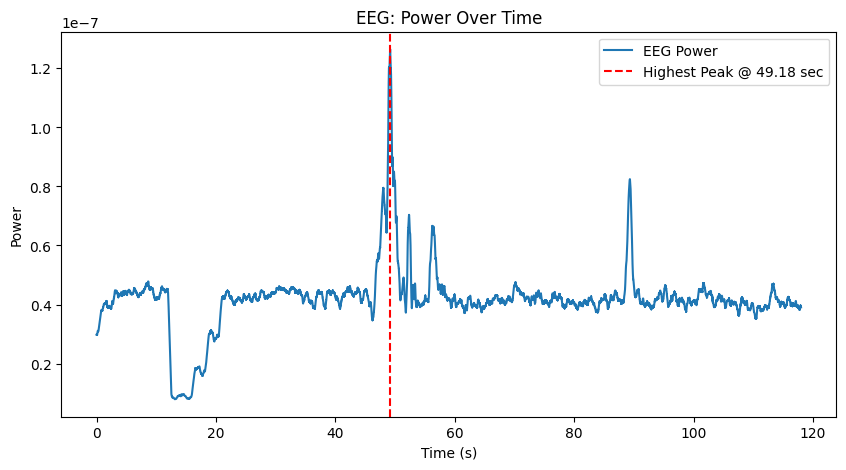

---
Processing subject P4-2004 for block baseline...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1.2e+02 - 1.3e+02 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 120.00
- Lower transition bandwidth: 30.00 Hz (-6 dB cutoff frequency: 105.00 Hz)
- Upper passband edge: 130.00 Hz
- Upper transition bandwidth: 32.50 Hz (-6 dB cutoff frequency: 146.25 Hz)
- Filter length: 221 samples (0.111 s)

NOTE: tfr_multitaper() is a legacy function. New code should use .compute_tfr(method="multitaper").
inst is Evoked, setting `average=False`
---
Peak time logged in sync_log.txt
---
Please close the plot to continue.
---


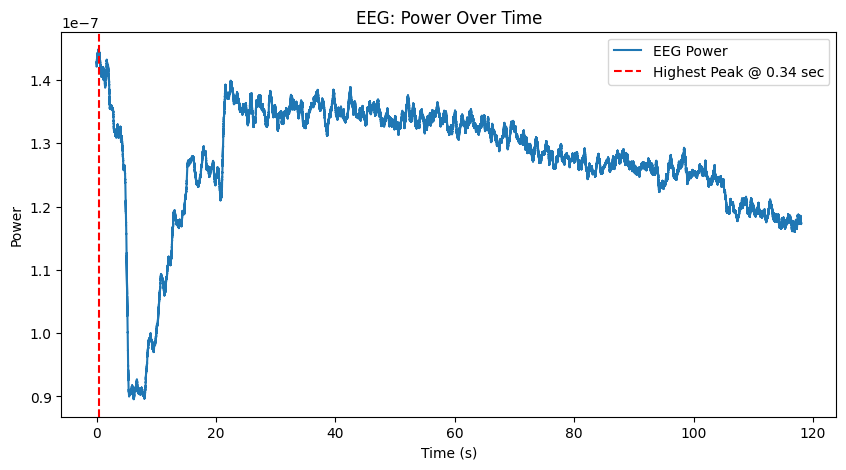

---
Processing subject P4-2005 for block baseline...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1.2e+02 - 1.3e+02 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 120.00
- Lower transition bandwidth: 30.00 Hz (-6 dB cutoff frequency: 105.00 Hz)
- Upper passband edge: 130.00 Hz
- Upper transition bandwidth: 32.50 Hz (-6 dB cutoff frequency: 146.25 Hz)
- Filter length: 221 samples (0.111 s)

NOTE: tfr_multitaper() is a legacy function. New code should use .compute_tfr(method="multitaper").
inst is Evoked, setting `average=False`
---
Peak time logged in sync_log.txt
---
Please close the plot to continue.
---


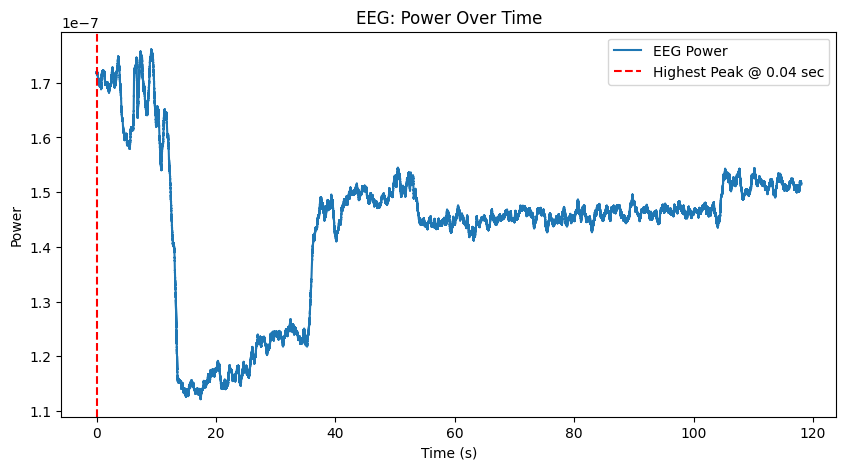

---
Processing subject P4-2007 for block baseline...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1.1e+02 - 1.2e+02 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 110.00
- Lower transition bandwidth: 27.50 Hz (-6 dB cutoff frequency: 96.25 Hz)
- Upper passband edge: 120.00 Hz
- Upper transition bandwidth: 5.00 Hz (-6 dB cutoff frequency: 122.50 Hz)
- Filter length: 165 samples (0.660 s)

NOTE: tfr_multitaper() is a legacy function. New code should use .compute_tfr(method="multitaper").
inst is Evoked, setting `average=False`
---
Peak time logged in sync_log.txt
---
Please close the plot to continue.
---


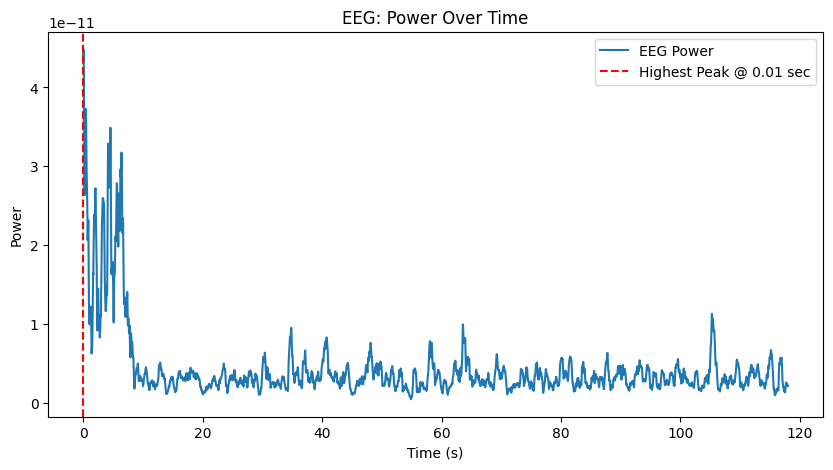

---
Processing subject P4-2008 for block baseline...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1.2e+02 - 1.3e+02 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 120.00
- Lower transition bandwidth: 30.00 Hz (-6 dB cutoff frequency: 105.00 Hz)
- Upper passband edge: 130.00 Hz
- Upper transition bandwidth: 32.50 Hz (-6 dB cutoff frequency: 146.25 Hz)
- Filter length: 221 samples (0.111 s)

NOTE: tfr_multitaper() is a legacy function. New code should use .compute_tfr(method="multitaper").
inst is Evoked, setting `average=False`
---
Peak time logged in sync_log.txt
---
Please close the plot to continue.
---


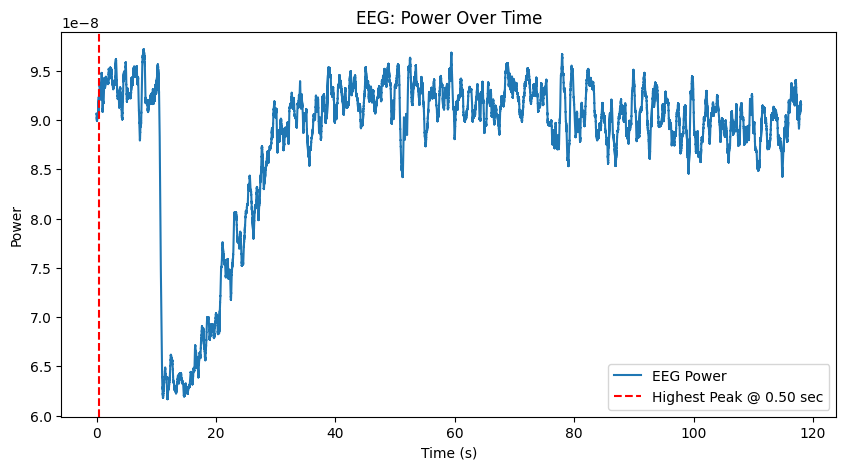

---
Processing subject P4-2009 for block baseline...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1.2e+02 - 1.3e+02 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 120.00
- Lower transition bandwidth: 30.00 Hz (-6 dB cutoff frequency: 105.00 Hz)
- Upper passband edge: 130.00 Hz
- Upper transition bandwidth: 32.50 Hz (-6 dB cutoff frequency: 146.25 Hz)
- Filter length: 221 samples (0.111 s)

NOTE: tfr_multitaper() is a legacy function. New code should use .compute_tfr(method="multitaper").
inst is Evoked, setting `average=False`
---
Peak time logged in sync_log.txt
---
Please close the plot to continue.
---


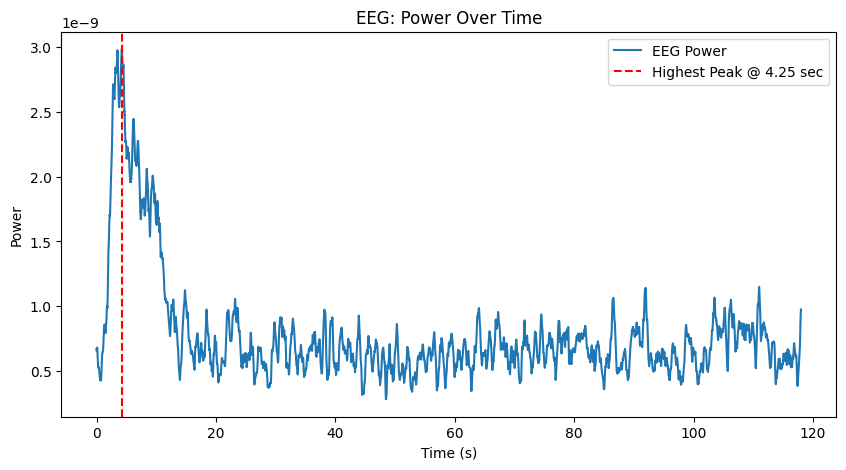

In [3]:
# loop through subjects

for sub_id in sub_ids:

    print(f"---\nProcessing subject {sub_id} for block {block}...")
    eeglab_file_path_components = [dataDir_server, sub_id, 'ProcessedData', 'EEG', block, block + '_prep.set']
    eeglab_file_path = os.path.join(*eeglab_file_path_components)
    # check if the file exists, if not, skip the subject
    if not os.path.exists(eeglab_file_path):
        print(f"---\nSkipping subject {sub_id} for block {block} as the file {eeglab_file_path} does not exist.")
        continue
    #  Load the EEG data
    raw = mne.io.read_raw_eeglab(eeglab_file_path, preload=True)
    eeg_fs = raw.info['sfreq']

    # if subject is not P4-2006, use the default frequency range
    if sub_id == 'P4-2007':
        freq_low, freq_high = 110, 120
        
    else:   
        freq_low, freq_high = 120, 130

    eeg_power, power_time_axis = compute_eeg_power(raw, freq_low, freq_high, duration_sec=120, channel="Cz")
    
    eeg_peak_idx, eeg_peak_time = find_eeg_peak(eeg_power, eeg_fs, power_time_axis, save_dir=None)



# Drop Detection

In [ ]:
def detect_eeg_drop_onset_window(
    eeg_power,
    eeg_fs,
    smooth_window=301, 
    window_size_sec=2, 
    plot=False, 
    save_dir=None
):
    """
    Detect all drops in EEG signal based on local window change.

    Returns:
    - drops: list of dicts with keys {"index", "magnitude"}
    - largest_drop: dict
    - first_drop: dict
    - smoothed: np.ndarray
    """

    # --- Signal prep ---
    smoothed = savgol_filter(eeg_power, window_length=smooth_window, polyorder=3)

    # --- Drop detection ---
    window_size = int(window_size_sec * eeg_fs)

    min_diff = np.inf
    drop_onset_idx = None
    drop_onset_time = None
    for i in range(0, len(smoothed) - 2 * window_size):
        pre_window = smoothed[i : i + window_size]
        post_window = smoothed[i + window_size : i + 2 * window_size]
        diff = np.mean(post_window) - np.mean(pre_window)

        if diff < min_diff:
            min_diff = diff
            drop_onset_idx = i + window_size
            drop_onset_time = drop_onset_idx / eeg_fs

    if drop_onset_idx is None:
        print("⚠️ No clear drop detected. Consider adjusting parameters.")
        return None, None, smoothed 
    
    # --- Plotting ---

    if plot and drop_onset_idx is not None:
        fig = go.Figure()
        fig.add_trace(go.Scatter(
            y=smoothed,
            mode="lines",
            name="Smoothed Power Band Sum"
        ))

        fig.add_vline(
            x=drop_onset_idx,
            line=dict(color="red", dash="dash"),
            # annotation_text=f"Drop Onset: {drop_onset_idx}",
            # annotation_position="top right",
        )

        fig.add_annotation(
            x=drop_onset_idx - drop_onset_idx * 0.1,
            y=max(smoothed),
            text=f"Drop Idx: {drop_onset_idx} | Drop Time: {drop_onset_time:.2f}s",
            showarrow=False,
            font=dict(color="red")
        )

        fig.update_layout(
            title="Drop Onset Detection (Windowed)",
            xaxis_title="Samples",
            yaxis_title="Power",
            legend=dict(x=0.01, y=0.99),
        )

        fig.show()

        # Save if requested
        if save_dir:
            os.makedirs(save_dir, exist_ok=True)
            fig.write_image(os.path.join(save_dir, "drop_onset_detection_windowed.png"))
            
    return drop_onset_idx, drop_onset_time, smoothed

In [9]:
# loop through subjects

for sub_id in sub_ids:

    print(f"---\nProcessing subject {sub_id} for block {block}...")
    eeglab_file_path_components = [dataDir_server, sub_id, 'ProcessedData', 'EEG', block, block + '_prep.set']
    eeglab_file_path = os.path.join(*eeglab_file_path_components)
    # check if the file exists, if not, skip the subject
    if not os.path.exists(eeglab_file_path):
        print(f"---\nSkipping subject {sub_id} for block {block} as the file {eeglab_file_path} does not exist.")
        continue
    #  Load the EEG data
    raw = mne.io.read_raw_eeglab(eeglab_file_path, preload=True)
    eeg_fs = raw.info['sfreq']

    # if subject is not P4-2006, use the default frequency range
    if sub_id == 'P4-2007':
        freq_low, freq_high = 110, 120
        
    else:   
        freq_low, freq_high = 120, 130

    eeg_power, power_time_axis = compute_eeg_power(raw, freq_low, freq_high, duration_sec=120, channel="Cz")
    
    drop_idx, drop_onset_s, smoothed = detect_eeg_drop_onset_window(eeg_power, eeg_fs=eeg_fs, smooth_window=301, window_size_sec=4, plot=True)
   

---
Processing subject P4-2001 for block baseline...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1.2e+02 - 1.3e+02 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 120.00
- Lower transition bandwidth: 30.00 Hz (-6 dB cutoff frequency: 105.00 Hz)
- Upper passband edge: 130.00 Hz
- Upper transition bandwidth: 32.50 Hz (-6 dB cutoff frequency: 146.25 Hz)
- Filter length: 221 samples (0.111 s)

NOTE: tfr_multitaper() is a legacy function. New code should use .compute_tfr(method="multitaper").
inst is Evoked, setting `average=False`


---
Processing subject P4-2002 for block baseline...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1.2e+02 - 1.3e+02 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 120.00
- Lower transition bandwidth: 30.00 Hz (-6 dB cutoff frequency: 105.00 Hz)
- Upper passband edge: 130.00 Hz
- Upper transition bandwidth: 32.50 Hz (-6 dB cutoff frequency: 146.25 Hz)
- Filter length: 221 samples (0.111 s)

NOTE: tfr_multitaper() is a legacy function. New code should use .compute_tfr(method="multitaper").
inst is Evoked, setting `average=False`


---
Processing subject P4-2003 for block baseline...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1.2e+02 - 1.3e+02 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 120.00
- Lower transition bandwidth: 30.00 Hz (-6 dB cutoff frequency: 105.00 Hz)
- Upper passband edge: 130.00 Hz
- Upper transition bandwidth: 32.50 Hz (-6 dB cutoff frequency: 146.25 Hz)
- Filter length: 221 samples (0.111 s)

NOTE: tfr_multitaper() is a legacy function. New code should use .compute_tfr(method="multitaper").
inst is Evoked, setting `average=False`


---
Processing subject P4-2004 for block baseline...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1.2e+02 - 1.3e+02 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 120.00
- Lower transition bandwidth: 30.00 Hz (-6 dB cutoff frequency: 105.00 Hz)
- Upper passband edge: 130.00 Hz
- Upper transition bandwidth: 32.50 Hz (-6 dB cutoff frequency: 146.25 Hz)
- Filter length: 221 samples (0.111 s)

NOTE: tfr_multitaper() is a legacy function. New code should use .compute_tfr(method="multitaper").
inst is Evoked, setting `average=False`


---
Processing subject P4-2005 for block baseline...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1.2e+02 - 1.3e+02 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 120.00
- Lower transition bandwidth: 30.00 Hz (-6 dB cutoff frequency: 105.00 Hz)
- Upper passband edge: 130.00 Hz
- Upper transition bandwidth: 32.50 Hz (-6 dB cutoff frequency: 146.25 Hz)
- Filter length: 221 samples (0.111 s)

NOTE: tfr_multitaper() is a legacy function. New code should use .compute_tfr(method="multitaper").
inst is Evoked, setting `average=False`


---
Processing subject P4-2007 for block baseline...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1.1e+02 - 1.2e+02 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 110.00
- Lower transition bandwidth: 27.50 Hz (-6 dB cutoff frequency: 96.25 Hz)
- Upper passband edge: 120.00 Hz
- Upper transition bandwidth: 5.00 Hz (-6 dB cutoff frequency: 122.50 Hz)
- Filter length: 165 samples (0.660 s)

NOTE: tfr_multitaper() is a legacy function. New code should use .compute_tfr(method="multitaper").
inst is Evoked, setting `average=False`


---
Processing subject P4-2008 for block baseline...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1.2e+02 - 1.3e+02 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 120.00
- Lower transition bandwidth: 30.00 Hz (-6 dB cutoff frequency: 105.00 Hz)
- Upper passband edge: 130.00 Hz
- Upper transition bandwidth: 32.50 Hz (-6 dB cutoff frequency: 146.25 Hz)
- Filter length: 221 samples (0.111 s)

NOTE: tfr_multitaper() is a legacy function. New code should use .compute_tfr(method="multitaper").
inst is Evoked, setting `average=False`


---
Processing subject P4-2009 for block baseline...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1.2e+02 - 1.3e+02 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 120.00
- Lower transition bandwidth: 30.00 Hz (-6 dB cutoff frequency: 105.00 Hz)
- Upper passband edge: 130.00 Hz
- Upper transition bandwidth: 32.50 Hz (-6 dB cutoff frequency: 146.25 Hz)
- Filter length: 221 samples (0.111 s)

NOTE: tfr_multitaper() is a legacy function. New code should use .compute_tfr(method="multitaper").
inst is Evoked, setting `average=False`


## Detect all drops

In [6]:
def detect_all_eeg_drops(
    eeg_power,
    eeg_fs,
    # smooth_window=1001, # less smoothing: 301
    smooth_window=301,
    window_size_sec=4,
    plot=True,
    save_dir=None
):
    """
    Detect all drops in EEG signal based on local window change.

    Returns:
    - drops: list of dicts with keys {"index", "magnitude"}
    - largest_drop: dict
    - first_drop: dict
    - smoothed: np.ndarray
    """
    # --- Signal prep ---
    smoothed = savgol_filter(eeg_power, window_length=smooth_window, polyorder=3)

    # --- Drop detection ---
    window_size = int(window_size_sec * eeg_fs)

    drops = []

    for i in range(0, len(smoothed) - 2 * window_size):
        pre_window = smoothed[i : i + window_size]
        post_window = smoothed[i + window_size : i + 2 * window_size]
        diff = np.mean(post_window) - np.mean(pre_window)

        if diff < 0:  # only negative drops
            drop_idx = i + window_size
            drops.append({"index": drop_idx, "magnitude": diff})

    # --- Optional threshold filtering ---
    drop_threshold = 0.1 * np.std(smoothed)
    if drop_threshold is not None:
        drops = [d for d in drops if d["magnitude"] <= -drop_threshold]

    # --- Select significant & first drops ---
    largest_drop = None
    first_drop = None
    if drops:
        largest_drop = min(drops, key=lambda x: x["magnitude"])  # most negative
        first_drop = min(drops, key=lambda x: x["index"])

    # --- Plotting ---
    if plot:
        plt.figure(figsize=(12, 6))
        plt.plot(smoothed, label="Smoothed Power Band Sum")

        for d in drops:
            plt.axvline(d["index"], color="gray", linestyle=":", alpha=0.6)

        if largest_drop:
            plt.axvline(largest_drop["index"], color="r", linestyle="--", label="Largest Drop")

        if first_drop and (first_drop != largest_drop):
            plt.axvline(first_drop["index"], color="g", linestyle="--", label="First Drop")

        plt.xlabel("Samples")
        plt.ylabel("Power")
        plt.title("All Drop Detections")
        plt.legend()
        if save_dir:
            os.makedirs(save_dir, exist_ok=True)
            plt.savefig(os.path.join(save_dir, "all_drop_detections.png"))
        plt.show()

    return drops, largest_drop, first_drop, smoothed

---
Processing subject P4-2001 for block baseline...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1.2e+02 - 1.3e+02 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 120.00
- Lower transition bandwidth: 30.00 Hz (-6 dB cutoff frequency: 105.00 Hz)
- Upper passband edge: 130.00 Hz
- Upper transition bandwidth: 32.50 Hz (-6 dB cutoff frequency: 146.25 Hz)
- Filter length: 221 samples (0.111 s)

NOTE: tfr_multitaper() is a legacy function. New code should use .compute_tfr(method="multitaper").
inst is Evoked, setting `average=False`


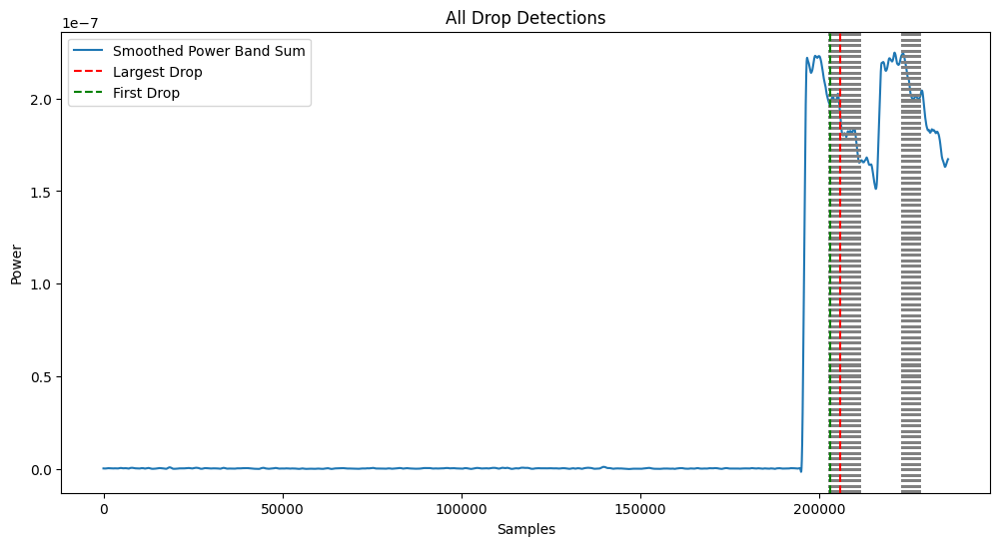

Total drops detected: 12859
---
Processing subject P4-2002 for block baseline...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1.2e+02 - 1.3e+02 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 120.00
- Lower transition bandwidth: 30.00 Hz (-6 dB cutoff frequency: 105.00 Hz)
- Upper passband edge: 130.00 Hz
- Upper transition bandwidth: 32.50 Hz (-6 dB cutoff frequency: 146.25 Hz)
- Filter length: 221 samples (0.111 s)

NOTE: tfr_multitaper() is a legacy function. New code should use .compute_tfr(method="multitaper").
inst is Evoked, setting `average=False`


KeyboardInterrupt: 

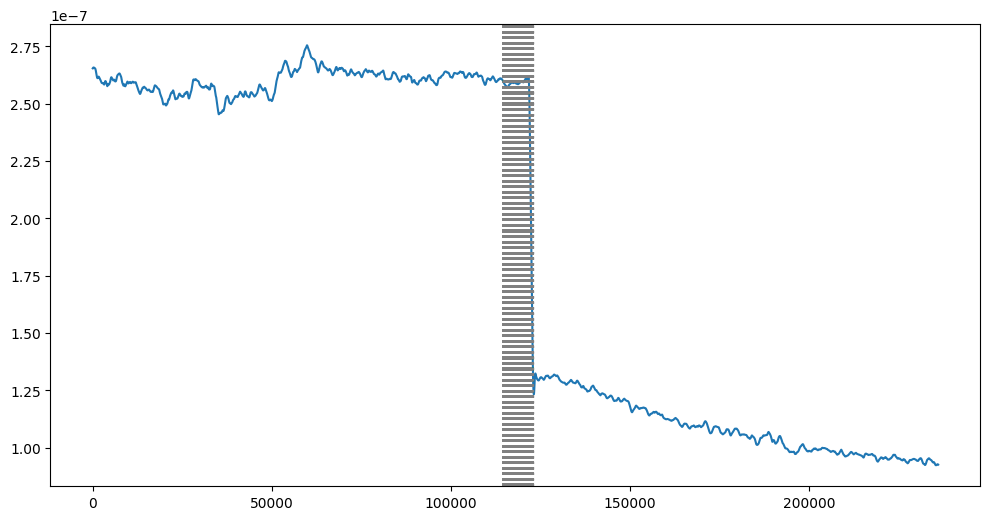

In [7]:
# loop through subjects

for sub_id in sub_ids:

    print(f"---\nProcessing subject {sub_id} for block {block}...")
    eeglab_file_path_components = [dataDir_server, sub_id, 'ProcessedData', 'EEG', block, block + '_prep.set']
    eeglab_file_path = os.path.join(*eeglab_file_path_components)
    # check if the file exists, if not, skip the subject
    if not os.path.exists(eeglab_file_path):
        print(f"---\nSkipping subject {sub_id} for block {block} as the file {eeglab_file_path} does not exist.")
        continue
    #  Load the EEG data
    raw = mne.io.read_raw_eeglab(eeglab_file_path, preload=True)
    eeg_fs = raw.info['sfreq']

    # if subject is not P4-2006, use the default frequency range
    if sub_id == 'P4-2007':
        freq_low, freq_high = 110, 120
        
    else:   
        freq_low, freq_high = 120, 130

    eeg_power, power_time_axis = compute_eeg_power(raw, freq_low, freq_high, duration_sec=120, channel="Cz")
    
    # Drop detection
    drops, largest_drop, first_drop, smoothed = detect_all_eeg_drops(eeg_power, eeg_fs, smooth_window=1001, window_size_sec=4, plot=True)
    print(f"Total drops detected: {len(drops)}")


# Hybrid EEG Drop Detection
Window-based detection (fast drops)  
	•	Cumulative drop detection (slow gradual drops)  
	•	Both combined in "hybrid" mode → It reports any drop detected by either method  
	•	Optional plotting of both detections  
	•	Optional adaptive thresholding  

In [ ]:
def compute_drop_confidence(smoothed, drop_idx, window_size, baseline_samples=2000):
    """
    Compute confidence score based on drop magnitude vs baseline variability.
    """
    baseline = smoothed[:baseline_samples]
    baseline_std = np.std(baseline)

    pre_window = smoothed[drop_idx - window_size : drop_idx]
    post_window = smoothed[drop_idx : drop_idx + window_size]
    drop_magnitude = np.mean(post_window) - np.mean(pre_window)

    confidence = (-drop_magnitude) / baseline_std
    return confidence

def detect_eeg_drops_hybrid(
    eeg_power,
    eeg_fs,
    smooth_window=301,
    window_size_sec=2,
    cumulative_window_sec=10,
    drop_threshold_factor=0.1,
    method="hybrid",
    min_magnitude=None,
    min_distance_sec=5,
    plot=True,
    save_dir=None
):
    """
    Hybrid drop detector with confidence score & optional filtering.

    Returns:
    - filtered_drops: list of dicts with keys {"index", "magnitude", "method", "confidence"}
    - smoothed: np.ndarray
    """
    # --- Smoothing ---
    smoothed = savgol_filter(eeg_power, window_length=smooth_window, polyorder=3)

    detected_drops = []

    # --- Method 1: Local Window Detection ---
    if method in ["window", "hybrid"]:
        window_size = int(window_size_sec * eeg_fs)
        threshold_local = drop_threshold_factor * np.std(smoothed)

        for i in range(0, len(smoothed) - 2 * window_size):
            pre_window = smoothed[i : i + window_size]
            post_window = smoothed[i + window_size : i + 2 * window_size]
            diff = np.mean(post_window) - np.mean(pre_window)

            if diff < -threshold_local:
                drop_idx = i + window_size
                confidence = compute_drop_confidence(smoothed, drop_idx, window_size)
                detected_drops.append({
                    "index": drop_idx,
                    "magnitude": diff,
                    "method": "window",
                    "confidence": confidence
                })

    # --- Method 2: Cumulative Trend Detection ---
    if method in ["cumulative", "hybrid"]:
        cum_window = int(cumulative_window_sec * eeg_fs)
        rolling_mean = np.convolve(smoothed, np.ones(cum_window)/cum_window, mode='valid')
        trend = np.gradient(rolling_mean)

        threshold_cum = -drop_threshold_factor * np.std(trend)

        for i in range(1, len(trend)):
            if trend[i] < threshold_cum:
                drop_idx = i + cum_window // 2
                confidence = compute_drop_confidence(smoothed, drop_idx, int(window_size_sec * eeg_fs))
                detected_drops.append({
                    "index": drop_idx,
                    "magnitude": trend[i],
                    "method": "cumulative",
                    "confidence": confidence
                })

    # --- Optional Post-filtering ---
    if min_magnitude:
        detected_drops = [d for d in detected_drops if abs(d["magnitude"]) > min_magnitude]

    if min_distance_sec:
        min_distance = int(min_distance_sec * eeg_fs)
        filtered = []
        last_idx = -min_distance
        for d in sorted(detected_drops, key=lambda x: x["index"]):
            if d["index"] - last_idx >= min_distance:
                filtered.append(d)
                last_idx = d["index"]
        detected_drops = filtered

    # --- Plot ---
    if plot:
        plt.figure(figsize=(12, 6))
        plt.plot(smoothed, label="Smoothed Power Band Sum")

        for d in detected_drops:
            color = "r" if d["method"] == "window" else "g"
            plt.axvline(d["index"], color=color, linestyle="--", alpha=0.6)
            plt.text(d["index"], np.min(smoothed), f"{d['confidence']:.2f}", color=color, fontsize=8, rotation=90)

        plt.xlabel("Samples")
        plt.ylabel("Power")
        plt.title(f"Detected Drops ({method})")
        plt.legend()
        if save_dir:
            os.makedirs(save_dir, exist_ok=True)
            plt.savefig(os.path.join(save_dir, "drop_detection_hybrid.png"))
        plt.show()

    return detected_drops, smoothed

---
Processing subject P4-2001 for block baseline...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1.2e+02 - 1.3e+02 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 120.00
- Lower transition bandwidth: 30.00 Hz (-6 dB cutoff frequency: 105.00 Hz)
- Upper passband edge: 130.00 Hz
- Upper transition bandwidth: 32.50 Hz (-6 dB cutoff frequency: 146.25 Hz)
- Filter length: 221 samples (0.111 s)

NOTE: tfr_multitaper() is a legacy function. New code should use .compute_tfr(method="multitaper").
inst is Evoked, setting `average=False`


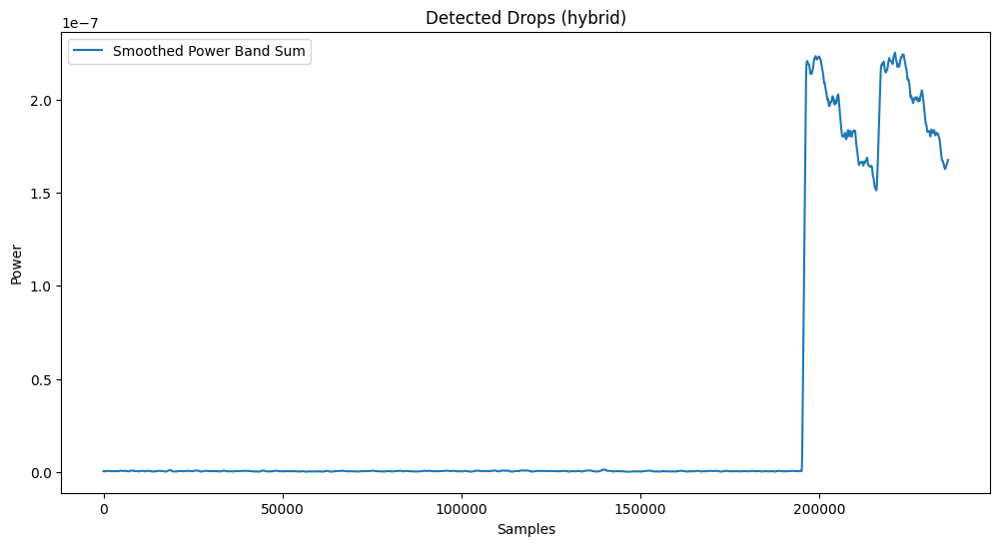

---
Processing subject P4-2002 for block baseline...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1.2e+02 - 1.3e+02 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 120.00
- Lower transition bandwidth: 30.00 Hz (-6 dB cutoff frequency: 105.00 Hz)
- Upper passband edge: 130.00 Hz
- Upper transition bandwidth: 32.50 Hz (-6 dB cutoff frequency: 146.25 Hz)
- Filter length: 221 samples (0.111 s)

NOTE: tfr_multitaper() is a legacy function. New code should use .compute_tfr(method="multitaper").
inst is Evoked, setting `average=False`


/Users/lenasalzmann/dev/dbs-eeg-sync/.venv/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning:

Mean of empty slice.

/Users/lenasalzmann/dev/dbs-eeg-sync/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:145: RuntimeWarning:

invalid value encountered in scalar divide



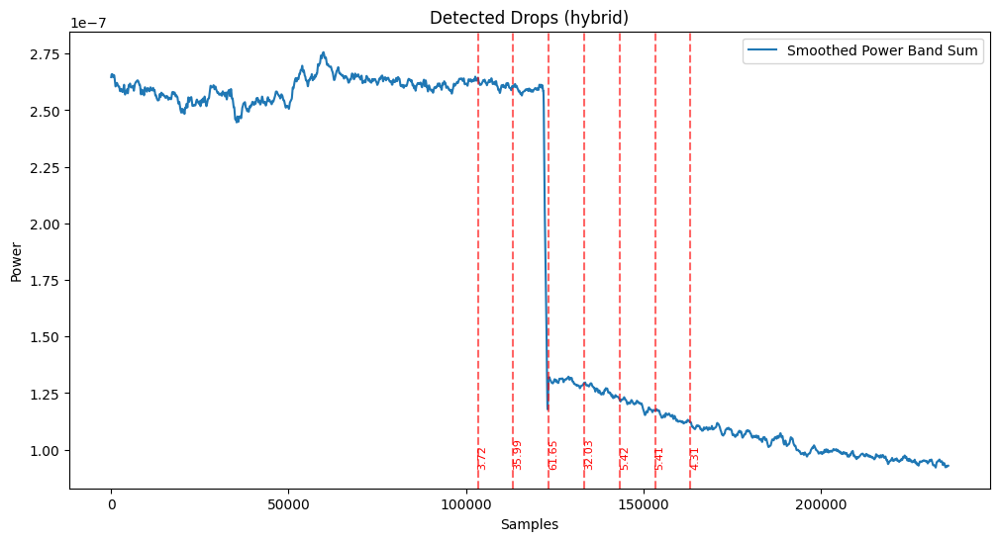

---
Processing subject P4-2003 for block baseline...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1.2e+02 - 1.3e+02 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 120.00
- Lower transition bandwidth: 30.00 Hz (-6 dB cutoff frequency: 105.00 Hz)
- Upper passband edge: 130.00 Hz
- Upper transition bandwidth: 32.50 Hz (-6 dB cutoff frequency: 146.25 Hz)
- Filter length: 221 samples (0.111 s)

NOTE: tfr_multitaper() is a legacy function. New code should use .compute_tfr(method="multitaper").
inst is Evoked, setting `average=False`


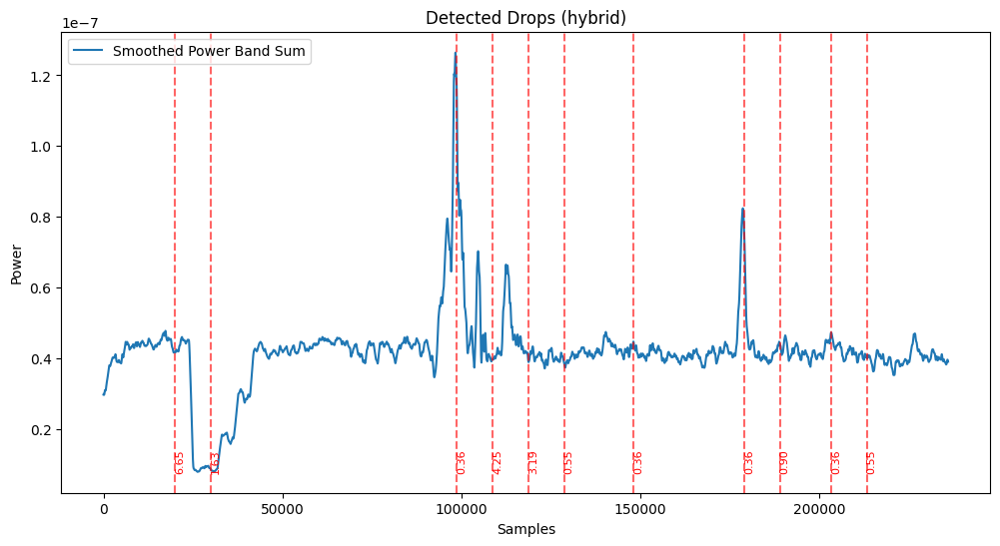

---
Processing subject P4-2004 for block baseline...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1.2e+02 - 1.3e+02 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 120.00
- Lower transition bandwidth: 30.00 Hz (-6 dB cutoff frequency: 105.00 Hz)
- Upper passband edge: 130.00 Hz
- Upper transition bandwidth: 32.50 Hz (-6 dB cutoff frequency: 146.25 Hz)
- Filter length: 221 samples (0.111 s)

NOTE: tfr_multitaper() is a legacy function. New code should use .compute_tfr(method="multitaper").
inst is Evoked, setting `average=False`


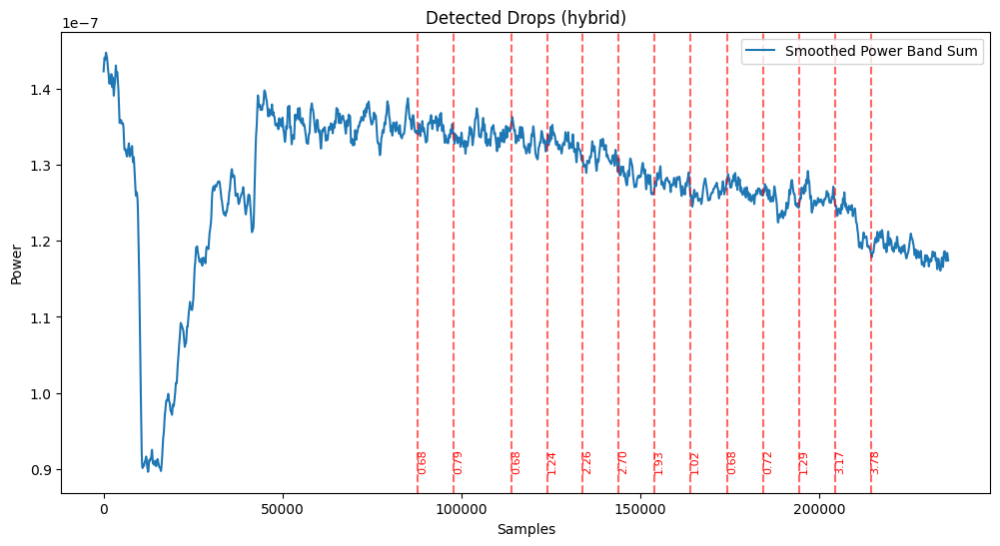

---
Processing subject P4-2005 for block baseline...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1.2e+02 - 1.3e+02 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 120.00
- Lower transition bandwidth: 30.00 Hz (-6 dB cutoff frequency: 105.00 Hz)
- Upper passband edge: 130.00 Hz
- Upper transition bandwidth: 32.50 Hz (-6 dB cutoff frequency: 146.25 Hz)
- Filter length: 221 samples (0.111 s)

NOTE: tfr_multitaper() is a legacy function. New code should use .compute_tfr(method="multitaper").
inst is Evoked, setting `average=False`


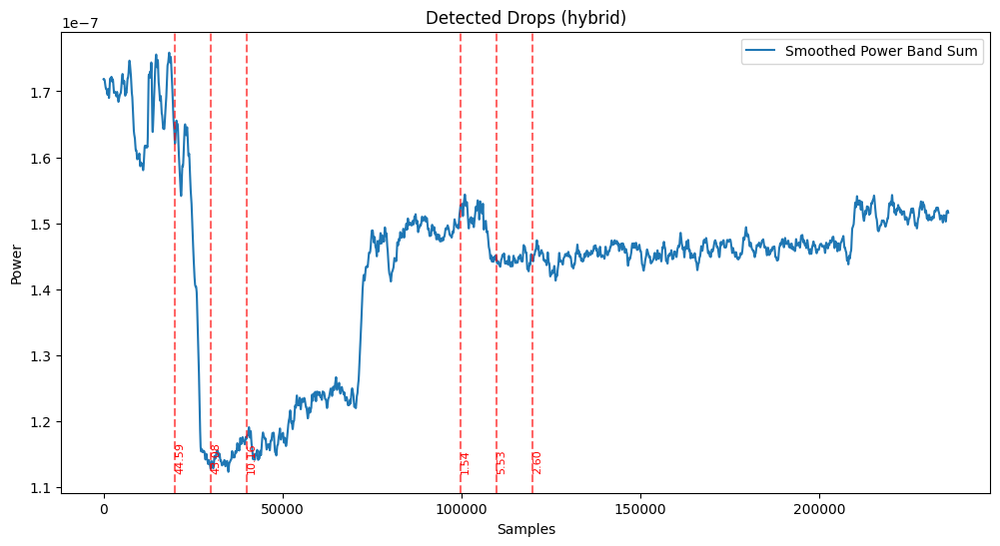

---
Processing subject P4-2007 for block baseline...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1.1e+02 - 1.2e+02 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 110.00
- Lower transition bandwidth: 27.50 Hz (-6 dB cutoff frequency: 96.25 Hz)
- Upper passband edge: 120.00 Hz
- Upper transition bandwidth: 5.00 Hz (-6 dB cutoff frequency: 122.50 Hz)
- Filter length: 165 samples (0.660 s)

NOTE: tfr_multitaper() is a legacy function. New code should use .compute_tfr(method="multitaper").
inst is Evoked, setting `average=False`


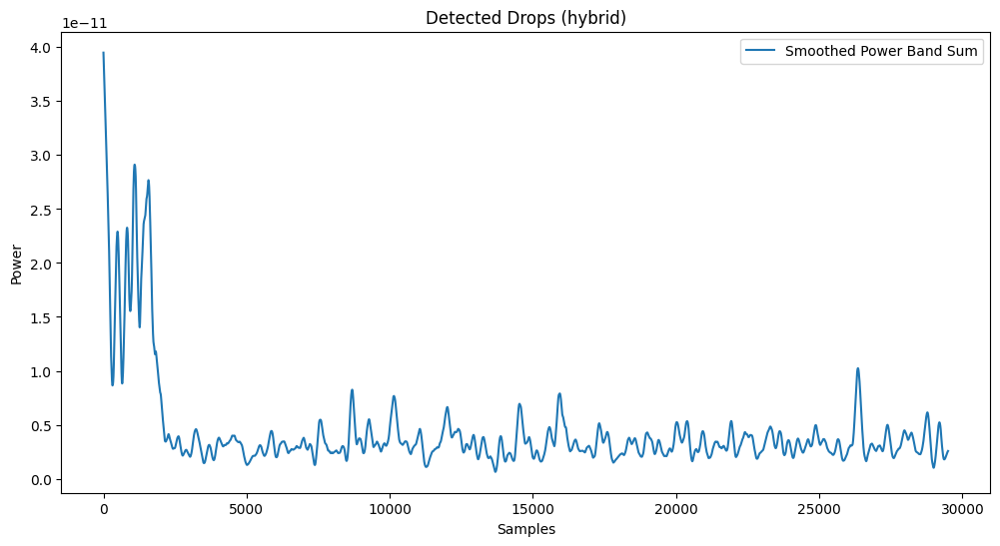

---
Processing subject P4-2008 for block baseline...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1.2e+02 - 1.3e+02 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 120.00
- Lower transition bandwidth: 30.00 Hz (-6 dB cutoff frequency: 105.00 Hz)
- Upper passband edge: 130.00 Hz
- Upper transition bandwidth: 32.50 Hz (-6 dB cutoff frequency: 146.25 Hz)
- Filter length: 221 samples (0.111 s)

NOTE: tfr_multitaper() is a legacy function. New code should use .compute_tfr(method="multitaper").
inst is Evoked, setting `average=False`


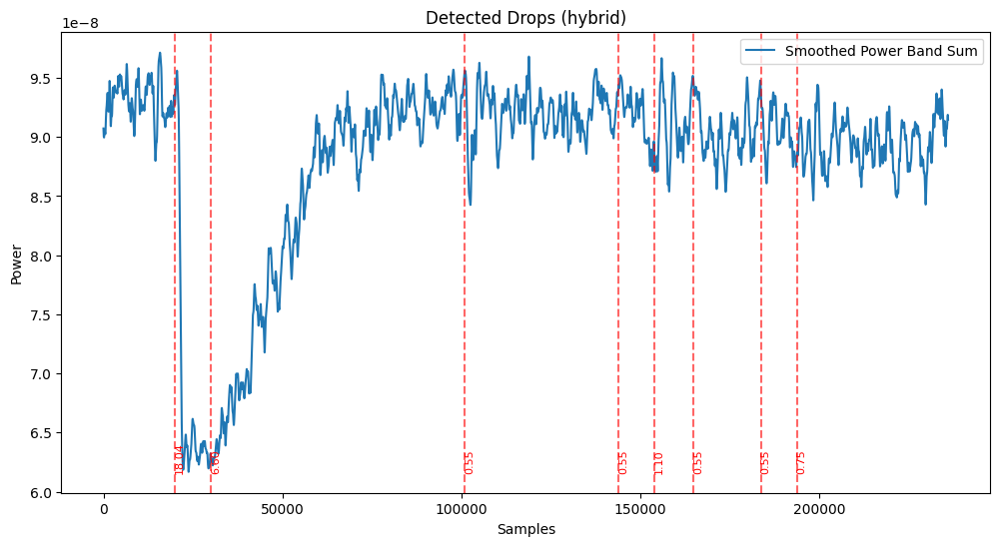

---
Processing subject P4-2009 for block baseline...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1.2e+02 - 1.3e+02 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 120.00
- Lower transition bandwidth: 30.00 Hz (-6 dB cutoff frequency: 105.00 Hz)
- Upper passband edge: 130.00 Hz
- Upper transition bandwidth: 32.50 Hz (-6 dB cutoff frequency: 146.25 Hz)
- Filter length: 221 samples (0.111 s)

NOTE: tfr_multitaper() is a legacy function. New code should use .compute_tfr(method="multitaper").
inst is Evoked, setting `average=False`


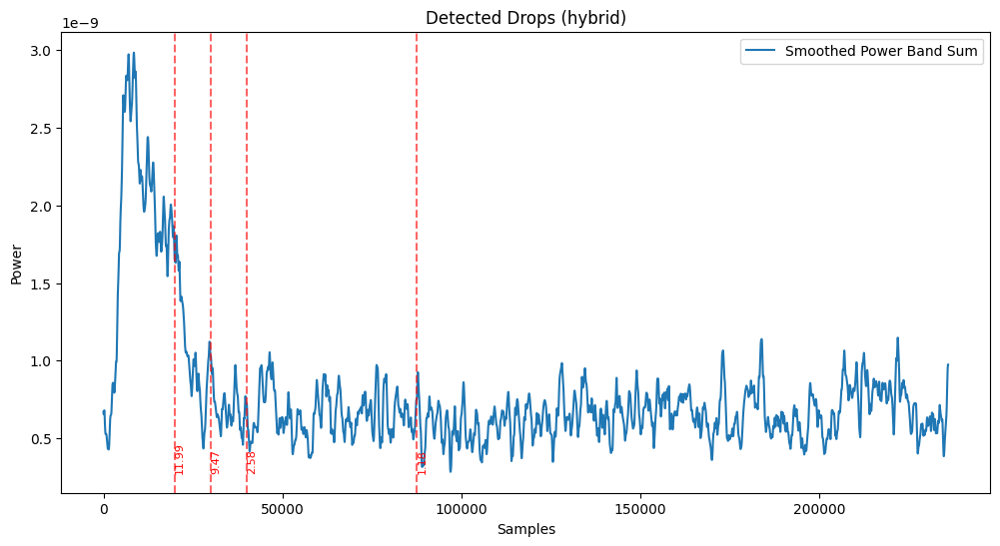

In [ ]:
# loop through subjects

for sub_id in sub_ids:

    print(f"---\nProcessing subject {sub_id} for block {block}...")
    eeglab_file_path_components = [dataDir_server, sub_id, 'ProcessedData', 'EEG', block, block + '_prep.set']
    eeglab_file_path = os.path.join(*eeglab_file_path_components)
    # check if the file exists, if not, skip the subject
    if not os.path.exists(eeglab_file_path):
        print(f"---\nSkipping subject {sub_id} for block {block} as the file {eeglab_file_path} does not exist.")
        continue
    #  Load the EEG data
    raw = mne.io.read_raw_eeglab(eeglab_file_path, preload=True)
    eeg_fs = raw.info['sfreq']

    # if subject is not P4-2006, use the default frequency range
    if sub_id == 'P4-2007':
        freq_low, freq_high = 110, 120
        
    else:   
        freq_low, freq_high = 120, 130

    eeg_power, power_time_axis = compute_eeg_power(raw, freq_low, freq_high, duration_sec=120, channel="Cz")
    
    # Drop detection hybrid
    drops, smoothed = detect_eeg_drops_hybrid(eeg_power, eeg_fs, smooth_window=301, window_size_sec=10, cumulative_window_sec=2, drop_threshold_factor=0.1, 
                                              method="hybrid", min_magnitude=1e-10, min_distance_sec=5, plot=True)

# print(f"Detected {len(drops)} drops")
# for d in drops:
#     print(f"Drop at {d['index']} | Method: {d['method']} | Magnitude: {d['magnitude']:.2e} | Confidence: {d['confidence']:.2f}")


# Slider

In [ ]:
import matplotlib.pyplot as plt
from matplotlib.widgets import Slider
import numpy as np

def plot_drops_with_slider(smoothed, detected_drops):
    """
    Interactive plot of EEG smoothed power with drop selection slider.
    """
    if not detected_drops:
        print("No drops to display.")
        return

    drop_indices = [d["index"] for d in detected_drops]

    # --- Plot setup ---
    fig, ax = plt.subplots(figsize=(12, 6))
    plt.subplots_adjust(bottom=0.25)

    ax.plot(smoothed, label="Smoothed EEG Power", color='blue')
    vline = ax.axvline(drop_indices[0], color='red', linestyle='--', label="Selected Drop")

    ax.set_title("Select Drop Index")9.7865
    ax.set_xlabel("Samples")
    ax.set_ylabel("Power")
    ax.legend()

    # --- Slider setup ---
    ax_slider = plt.axes([0.25, 0.1, 0.5, 0.03])
    slider = Slider(
        ax=ax_slider,
        label="Drop Index",
        valmin=0,
        valmax=len(drop_indices) - 1,
        valinit=0,
        valstep=1
    )

    # --- Slider callback ---
    def update(val):
        drop_idx = drop_indices[int(slider.val)]
        vline.set_xdata(drop_idx)
        fig.canvas.draw_idle()

    slider.on_changed(update)

    plt.show()

# === Usage example ===
plot_drops_with_slider(smoothed, drops)

SyntaxError: invalid syntax (3255580559.py, line 22)